# Station Geography Explorer

Interactive exploration of Citi Bike station locations and their geographic boundaries.

**Data sources:**
- `reference/station_geography.csv` - Station to boundary mapping
- `reference/station_timeline.json` - Station first/last appearance dates
- `data/geo/processed/*.geojson` - Geographic boundary files

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster, HeatMap
import json
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Set display options
pd.set_option('display.max_columns', 20)
pd.set_option('display.max_rows', 100)

print("Libraries loaded!")

Libraries loaded!


/Users/davidpiegaro/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


## 1. Load Data

In [2]:
# Load station geography
geo = pd.read_csv("../reference/station_geography.csv")
print(f"Loaded {len(geo):,} stations")

# Load station timeline (structure: {'total_stations': int, 'stations': [list of dicts]})
with open("../reference/station_timeline.json") as f:
    timeline_raw = json.load(f)

# Convert timeline to DataFrame - only keep timeline-specific columns
timeline_list = timeline_raw.get('stations', [])
if timeline_list:
    timeline_df = pd.DataFrame(timeline_list)
    # Only keep columns we need for timeline analysis
    keep_cols = ['station_id', 'first_seen', 'last_seen', 'trip_count']
    timeline = timeline_df[[c for c in keep_cols if c in timeline_df.columns]].copy()
    timeline['first_seen'] = pd.to_datetime(timeline['first_seen'])
    timeline['last_seen'] = pd.to_datetime(timeline['last_seen'])
    print(f"Loaded timeline for {len(timeline):,} stations")
else:
    # Fallback: no timeline data available
    timeline = pd.DataFrame(columns=['station_id', 'first_seen', 'last_seen', 'trip_count'])
    print("Warning: No timeline data found")

# Merge
stations = geo.merge(timeline, on='station_id', how='left')
print(f"Combined dataset: {len(stations):,} stations")
print(f"Stations with timeline: {stations['first_seen'].notna().sum():,}")

Loaded 5,990 stations
Loaded timeline for 2,489 stations
Combined dataset: 5,990 stations
Stations with timeline: 2,377


## 2. Overview Statistics

In [3]:
print("=" * 60)
print("STATION GEOGRAPHY OVERVIEW")
print("=" * 60)

print(f"\nTotal stations: {len(stations):,}")
print(f"\nBy State:")
print(stations['state'].value_counts().to_string())

print(f"\nBy Borough/County:")
print(stations.groupby(['state', 'borough_county']).size().to_string())

print(f"\nBy Source:")
print(stations['source'].value_counts().to_string())

STATION GEOGRAPHY OVERVIEW

Total stations: 5,990

By State:
state
NY    5694
NJ     296

By Borough/County:
state  borough_county
NJ     Hudson County      296
NY     Bronx              686
       Brooklyn          1904
       Manhattan         2047
       Queens            1057

By Source:
source
crosswalk_nyc    3609
gbfs_current     2318
crosswalk_jc       63


In [4]:
# Geographic coverage
print("\n" + "=" * 60)
print("GEOGRAPHIC COVERAGE")
print("=" * 60)

coverage = pd.DataFrame({
    'Boundary': ['Borough/County', 'NTA 2010', 'NTA 2020', 'PUMA 2010', 'PUMA 2020', 'Tract 2010', 'Tract 2020'],
    'Column': ['borough_county', 'nta_2010_code', 'nta_2020_code', 'puma_2010_code', 'puma_2020_code', 'tract_2010', 'tract_2020'],
})
coverage['Matched'] = coverage['Column'].apply(lambda c: stations[c].notna().sum())
coverage['Total'] = len(stations)
coverage['Coverage %'] = (coverage['Matched'] / coverage['Total'] * 100).round(1)
print(coverage[['Boundary', 'Matched', 'Coverage %']].to_string(index=False))


GEOGRAPHIC COVERAGE
      Boundary  Matched  Coverage %
Borough/County     5990       100.0
      NTA 2010     5694        95.1
      NTA 2020     5694        95.1
     PUMA 2010     5694        95.1
     PUMA 2020     5876        98.1
    Tract 2010     5080        84.8
    Tract 2020     4686        78.2


In [5]:
# Sample of data
print("\n" + "=" * 60)
print("SAMPLE DATA (NYC)")
print("=" * 60)
display(stations[stations['state'] == 'NY'].head(10))


SAMPLE DATA (NYC)


,station_id,station_name,lat,lon,state,city,borough_county,nta_2010_code,nta_2010_name,nta_2020_code,nta_2020_name,puma_2010_code,puma_2020_code,puma_2020_name,tract_2010,tract_2020,source,first_seen,last_seen,trip_count
296,039d4cc9-8560-4d22-88c3-20753c54a50f,3 Ave & E 163 St,40.823872,-73.908699,NY,New York City,Bronx,BX35,Morrisania-Melrose,BX0301,Morrisania,3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2014100.0,2014100.0,gbfs_current,2020-09-17,2025-11-30,46214.0
297,7974.01,3 Ave & E 163 St,40.823872,-73.908699,NY,New York City,Bronx,BX35,Morrisania-Melrose,BX0301,Morrisania,3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2014100.0,2014100.0,crosswalk_nyc,NaT,NaT,NaN
298,c80c55c4-d623-42d7-8acf-6bfa68a84ecb,3 Ave & E 169 St,40.832678,-73.905158,NY,New York City,Bronx,BX01,Claremont-Bathgate,BX0302,Claremont Village-Claremont (East),3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2014500.0,2014500.0,gbfs_current,2020-09-18,2025-11-30,68944.0
299,8103.05,3 Ave & E 169 St,40.832678,-73.905158,NY,New York City,Bronx,BX01,Claremont-Bathgate,BX0302,Claremont Village-Claremont (East),3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2014500.0,2014500.0,crosswalk_nyc,NaT,NaT,NaN
300,8d8a381c-21df-4095-837e-65924d85a06d,3 Ave & E 170 St,40.834857,-73.903743,NY,New York City,Bronx,BX01,Claremont-Bathgate,BX0302,Claremont Village-Claremont (East),3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2014701.0,2014701.0,gbfs_current,2020-09-23,2025-11-30,54468.0
301,8137.06,3 Ave & E 170 St,40.834857,-73.903743,NY,New York City,Bronx,BX01,Claremont-Bathgate,BX0302,Claremont Village-Claremont (East),3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2014701.0,2014701.0,crosswalk_nyc,NaT,NaT,NaN
302,18267c09-1916-48d8-951c-caf88c89edd1,3 Ave & E 172 St,40.839586,-73.900277,NY,New York City,Bronx,BX01,Claremont-Bathgate,BX0302,Claremont Village-Claremont (East),3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2016700.0,2016700.0,gbfs_current,2020-09-30,2025-11-30,39009.0
303,8205.05,3 Ave & E 172 St,40.839586,-73.900277,NY,New York City,Bronx,BX01,Claremont-Bathgate,BX0302,Claremont Village-Claremont (East),3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2016700.0,2016700.0,crosswalk_nyc,NaT,NaT,NaN
304,c530a1cb-7c60-4651-be8a-9bfa5eb43f8a,3 Ave & E 174 St,40.842240,-73.898500,NY,New York City,Bronx,BX01,Claremont-Bathgate,BX0302,Claremont Village-Claremont (East),3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2016500.0,2016500.0,gbfs_current,2020-09-29,2025-11-30,30740.0
305,8241.07,3 Ave & E 174 St,40.842240,-73.898500,NY,New York City,Bronx,BX01,Claremont-Bathgate,BX0302,Claremont Village-Claremont (East),3705.0,4263.0,NYC-Bronx Community Districts 3 & 6--Morrisani...,2016500.0,2016500.0,crosswalk_nyc,NaT,NaT,NaN


In [6]:
print("\n" + "=" * 60)
print("SAMPLE DATA (NJ)")
print("=" * 60)
display(stations[stations['state'] == 'NJ'].head(10))


SAMPLE DATA (NJ)


,station_id,station_name,lat,lon,state,city,borough_county,nta_2010_code,nta_2010_name,nta_2020_code,nta_2020_name,puma_2010_code,puma_2020_code,puma_2020_name,tract_2010,tract_2020,source,first_seen,last_seen,trip_count
0,f417d8da-0f15-49b0-9e3c-3c3e55c2691d,11 St & Washington St,40.749985,-74.027150,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,603.0,Hudson County (Northeast)--Union City & Hoboke...,NaN,3.401702e+10,gbfs_current,NaT,NaT,NaN
1,bd6f422b-d7ae-4d7e-9261-653fdd8e6888,12 St & Sinatra Dr N,40.750604,-74.024020,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,603.0,Hudson County (Northeast)--Union City & Hoboke...,NaN,3.401702e+10,gbfs_current,NaT,NaT,NaN
2,4a48175b-c239-4d5e-b1b8-03eda4239678,14 St Ferry - 14 St & Shipyard Ln,40.752961,-74.024353,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,603.0,Hudson County (Northeast)--Union City & Hoboke...,NaN,3.401702e+10,gbfs_current,NaT,NaT,NaN
3,b6a13f2b-deb4-4f4d-9d67-7d23bee27c88,2 St & Park Ave,40.739153,-74.033082,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,603.0,Hudson County (Northeast)--Union City & Hoboke...,NaN,3.401702e+10,gbfs_current,NaT,NaT,NaN
4,3d1db3fa-1df5-46c8-baf3-619b729f5bda,4 St & Grand St,40.742258,-74.035111,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,603.0,Hudson County (Northeast)--Union City & Hoboke...,NaN,3.401702e+10,gbfs_current,NaT,NaT,NaN
5,1839334257267825432,4 St & River St,40.740814,-74.027406,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,603.0,Hudson County (Northeast)--Union City & Hoboke...,NaN,3.401702e+10,gbfs_current,NaT,NaT,NaN
6,66dd8b48-0aca-11e7-82f6-3863bb44ef7c,5 Corners Library,40.734961,-74.059503,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,601.0,Hudson County (Central)--Jersey City (North) PUMA,NaN,3.401700e+10,gbfs_current,NaT,NaT,NaN
7,3220,5 Corners Library,40.734961,-74.059503,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,601.0,Hudson County (Central)--Jersey City (North) PUMA,NaN,3.401700e+10,crosswalk_jc,2016-03-18,2016-03-18,1.0
8,9d344652-976b-4c2d-bede-2ef19b0fbf13,6 St & Grand St,40.744398,-74.034501,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,603.0,Hudson County (Northeast)--Union City & Hoboke...,NaN,3.401702e+10,gbfs_current,NaT,NaT,NaN
9,7478be11-37d8-49b1-a253-f0810045f6ff,7 St & Monroe St,40.746413,-74.037977,NJ,Hoboken,Hudson County,NaN,NaN,NaN,NaN,NaN,603.0,Hudson County (Northeast)--Union City & Hoboke...,NaN,3.401702e+10,gbfs_current,NaT,NaT,NaN


## 3. Station Timeline Analysis

In [7]:
# Filter to stations with timeline data
with_timeline = stations[stations['first_seen'].notna()].copy()
print(f"Stations with timeline data: {len(with_timeline):,}")

# Extract year
with_timeline['first_year'] = with_timeline['first_seen'].dt.year
with_timeline['last_year'] = with_timeline['last_seen'].dt.year

Stations with timeline data: 2,377


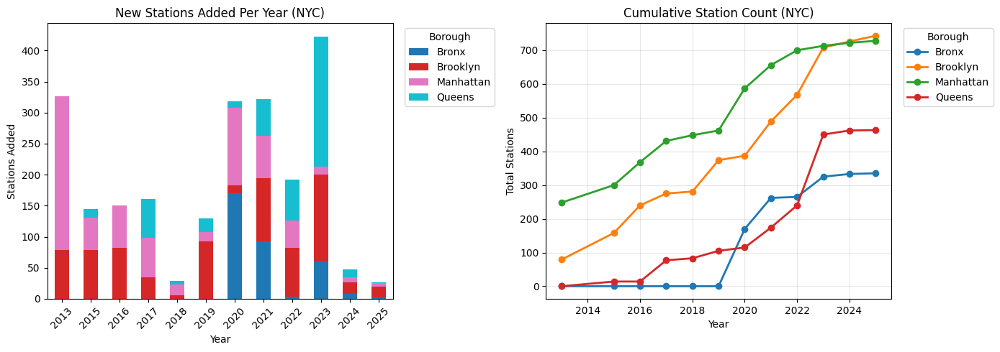

Saved: logs/station_growth_by_borough.png


In [8]:
# Stations added per year by borough
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# NYC only
nyc_timeline = with_timeline[with_timeline['state'] == 'NY']

# Stations added per year
added_by_year = nyc_timeline.groupby(['first_year', 'borough_county']).size().unstack(fill_value=0)
added_by_year.plot(kind='bar', stacked=True, ax=axes[0], colormap='tab10')
axes[0].set_title('New Stations Added Per Year (NYC)', fontsize=12)
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Stations Added')
axes[0].legend(title='Borough', bbox_to_anchor=(1.02, 1))
axes[0].tick_params(axis='x', rotation=45)

# Cumulative stations by borough
cumulative = added_by_year.cumsum()
cumulative.plot(ax=axes[1], marker='o', linewidth=2)
axes[1].set_title('Cumulative Station Count (NYC)', fontsize=12)
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Total Stations')
axes[1].legend(title='Borough', bbox_to_anchor=(1.02, 1))
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('../logs/station_growth_by_borough.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: logs/station_growth_by_borough.png")

In [9]:
# Table: Stations by borough and year
print("\nStations Added Per Year by Borough:")
print(added_by_year.to_string())

print("\nCumulative Stations by Borough:")
print(cumulative.to_string())


Stations Added Per Year by Borough:
borough_county  Bronx  Brooklyn  Manhattan  Queens
first_year                                        
2013                0        79        248       0
2015                0        79         52      14
2016                0        82         68       0
2017                0        35         63      63
2018                0         6         17       6
2019                0        93         14      22
2020              170        13        125      10
2021               92       102         69      59
2022                3        79         44      66
2023               60       140         13     210
2024                8        18          9      12
2025                2        17          6       1

Cumulative Stations by Borough:
borough_county  Bronx  Brooklyn  Manhattan  Queens
first_year                                        
2013                0        79        248       0
2015                0       158        300      14
2016        

## 4. NTA-Level Analysis

In [10]:
# Stations per NTA (2020)
nta_counts = stations[stations['nta_2020_code'].notna()].groupby(
    ['borough_county', 'nta_2020_code', 'nta_2020_name']
).size().reset_index(name='station_count')

print("Top 20 NTAs by Station Count:")
display(nta_counts.nlargest(20, 'station_count'))

Top 20 NTAs by Station Count:


,borough_county,nta_2020_code,nta_2020_name,station_count
39,Brooklyn,BK0601,Carroll Gardens-Cobble Hill-Gowanus-Red Hook,182
77,Manhattan,MN0502,Midtown-Times Square,143
74,Manhattan,MN0401,Chelsea-Hudson Yards,125
29,Brooklyn,BK0104,East Williamsburg,123
73,Manhattan,MN0303,East Village,118
120,Queens,QN0502,Ridgewood,112
27,Brooklyn,BK0102,Williamsburg,111
65,Manhattan,MN0101,Financial District-Battery Park City,109
31,Brooklyn,BK0202,Downtown Brooklyn-DUMBO-Boerum Hill,100
35,Brooklyn,BK0301,Bedford-Stuyvesant (West),99


In [11]:
# NTAs with NO stations
nta_2020 = gpd.read_file("../data/geo/processed/nta_2020_nyc.geojson")
ntas_with_stations = set(stations['nta_2020_code'].dropna().unique())
ntas_without = nta_2020[~nta_2020['nta_code'].isin(ntas_with_stations)][['nta_code', 'nta_name', 'LAST_BoroN']]

print(f"\nNTAs without any Citi Bike stations: {len(ntas_without)}")
print("\nSample (parks, airports, cemeteries expected):")
display(ntas_without.head(20))


NTAs without any Citi Bike stations: 140

Sample (parks, airports, cemeteries expected):


,nta_code,nta_name,LAST_BoroN
13,BK0471,The Evergreens Cemetery,Brooklyn
14,BK0501,Cypress Hills,Brooklyn
15,BK0502,East New York (North),Brooklyn
16,BK0503,East New York-New Lots,Brooklyn
17,BK0504,Spring Creek-Starrett City,Brooklyn
18,BK0505,East New York-City Line,Brooklyn
19,BK0571,Highland Park-Cypress Hills Cemeteries (South),Brooklyn
32,BK1002,Dyker Heights,Brooklyn
33,BK1061,Fort Hamilton,Brooklyn
35,BK1101,Bensonhurst,Brooklyn


## 5. Interactive Map: All Stations by Borough

In [12]:
# Color map for boroughs
borough_colors = {
    'Manhattan': 'blue',
    'Brooklyn': 'green',
    'Queens': 'orange',
    'Bronx': 'red',
    'Staten Island': 'purple',
    'Hudson County': 'darkgreen'
}

# Create map centered on NYC
m = folium.Map(location=[40.73, -73.99], zoom_start=12, tiles='cartodbpositron')

# Add stations with clustering
for borough, color in borough_colors.items():
    borough_stations = stations[stations['borough_county'] == borough]
    
    # Create feature group for this borough
    fg = folium.FeatureGroup(name=f"{borough} ({len(borough_stations):,} stations)")
    
    # Add markers
    for _, row in borough_stations.iterrows():
        station_id_str = str(row['station_id'])[:12] if pd.notna(row['station_id']) else 'N/A'
        nta_name = row['nta_2020_name'] if pd.notna(row['nta_2020_name']) else 'N/A'
        popup_text = f"""
        <b>{row['station_name']}</b><br>
        ID: {station_id_str}...<br>
        NTA: {nta_name}<br>
        Source: {row['source']}
        """
        folium.CircleMarker(
            location=[row['lat'], row['lon']],
            radius=4,
            color=color,
            fill=True,
            fillOpacity=0.7,
            popup=folium.Popup(popup_text, max_width=300)
        ).add_to(fg)
    
    fg.add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save and display
m.save('../logs/stations_by_borough.html')
print("Saved: logs/stations_by_borough.html")
m

Saved: logs/stations_by_borough.html


## 6. Interactive Map: Station Density Heatmap

In [13]:
# Heatmap of station density
m2 = folium.Map(location=[40.73, -73.99], zoom_start=12, tiles='cartodbdark_matter')

# Prepare heatmap data
heat_data = stations[['lat', 'lon']].dropna().values.tolist()

HeatMap(
    heat_data,
    radius=15,
    blur=10,
    max_zoom=13,
    gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 0.8: 'orange', 1: 'red'}
).add_to(m2)

m2.save('../logs/station_density_heatmap.html')
print("Saved: logs/station_density_heatmap.html")
m2

Saved: logs/station_density_heatmap.html


## 7. Interactive Map: NTA Boundaries with Station Counts

In [14]:
# Load NTA boundaries
nta_2020 = gpd.read_file("../data/geo/processed/nta_2020_nyc.geojson")

# Count stations per NTA
nta_station_counts = stations.groupby('nta_2020_code').size().reset_index(name='station_count')
nta_2020 = nta_2020.merge(nta_station_counts, left_on='nta_code', right_on='nta_2020_code', how='left')
nta_2020['station_count'] = nta_2020['station_count'].fillna(0).astype(int)

# Create choropleth map
m3 = folium.Map(location=[40.73, -73.99], zoom_start=11, tiles='cartodbpositron')

# Add choropleth
folium.Choropleth(
    geo_data=nta_2020.__geo_interface__,
    data=nta_2020,
    columns=['nta_code', 'station_count'],
    key_on='feature.properties.nta_code',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Citi Bike Stations per NTA',
    nan_fill_color='lightgray'
).add_to(m3)

# Add tooltips
folium.GeoJson(
    nta_2020,
    style_function=lambda x: {'fillOpacity': 0, 'color': 'transparent'},
    tooltip=folium.GeoJsonTooltip(
        fields=['nta_name', 'station_count'],
        aliases=['Neighborhood:', 'Stations:'],
        style='font-size: 12px;'
    )
).add_to(m3)

m3.save('../logs/nta_station_choropleth.html')
print("Saved: logs/nta_station_choropleth.html")
m3

Saved: logs/nta_station_choropleth.html


## 8. Station Expansion Over Time (Animated View)

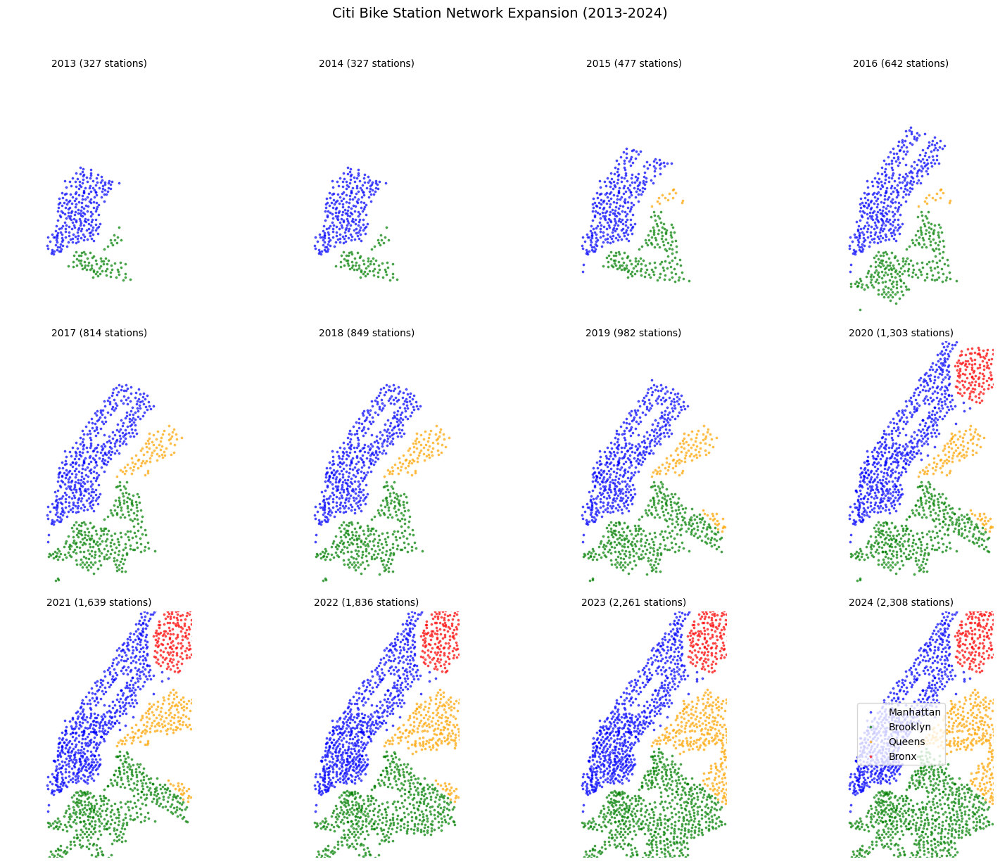

Saved: logs/station_expansion_timeline.png


In [15]:
# Create expansion timeline visualization
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()

years = range(2013, 2025)

for idx, year in enumerate(years):
    ax = axes[idx]
    
    # Get stations that existed by this year
    existing = with_timeline[with_timeline['first_year'] <= year]
    
    # Plot by borough
    for borough, color in [('Manhattan', 'blue'), ('Brooklyn', 'green'), 
                           ('Queens', 'orange'), ('Bronx', 'red')]:
        borough_data = existing[existing['borough_county'] == borough]
        ax.scatter(borough_data['lon'], borough_data['lat'], 
                   c=color, s=3, alpha=0.6, label=borough)
    
    ax.set_title(f'{year} ({len(existing):,} stations)', fontsize=10)
    ax.set_xlim(-74.05, -73.90)
    ax.set_ylim(40.65, 40.85)
    ax.set_aspect('equal')
    ax.axis('off')

# Add legend to last subplot
axes[-1].legend(loc='center', fontsize=10)
axes[-1].axis('off')

plt.suptitle('Citi Bike Station Network Expansion (2013-2024)', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig('../logs/station_expansion_timeline.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: logs/station_expansion_timeline.png")

## 9. NTA Growth Over Time

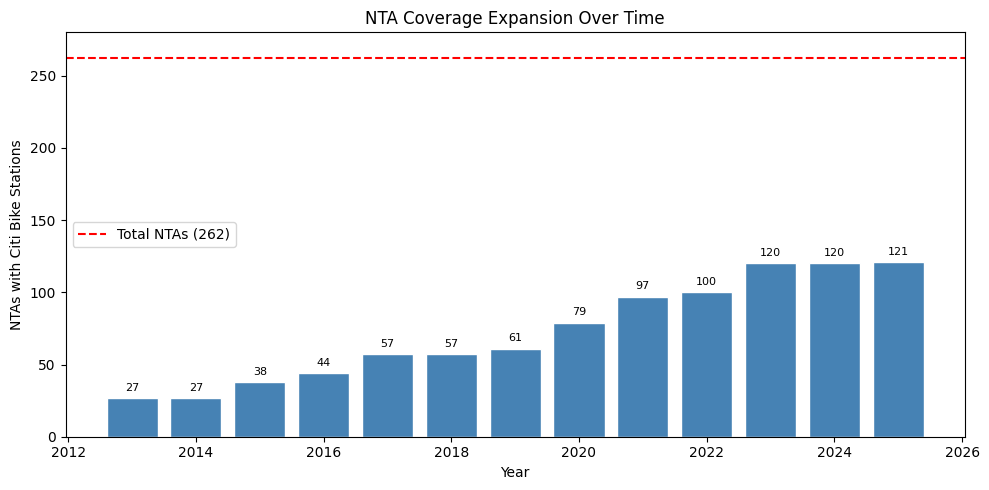

Saved: logs/nta_coverage_growth.png


In [16]:
# How many NTAs had stations by year?
nta_coverage_by_year = []

for year in range(2013, 2026):
    existing = with_timeline[with_timeline['first_year'] <= year]
    ntas_covered = existing['nta_2020_code'].dropna().nunique()
    nta_coverage_by_year.append({'year': year, 'ntas_covered': ntas_covered})

nta_coverage = pd.DataFrame(nta_coverage_by_year)

fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(nta_coverage['year'], nta_coverage['ntas_covered'], color='steelblue', edgecolor='white')
ax.axhline(y=262, color='red', linestyle='--', label='Total NTAs (262)')
ax.set_xlabel('Year')
ax.set_ylabel('NTAs with Citi Bike Stations')
ax.set_title('NTA Coverage Expansion Over Time')
ax.legend()
ax.set_ylim(0, 280)

# Add labels
for _, row in nta_coverage.iterrows():
    ax.text(row['year'], row['ntas_covered'] + 5, str(row['ntas_covered']), 
            ha='center', fontsize=8)

plt.tight_layout()
plt.savefig('../logs/nta_coverage_growth.png', dpi=150)
plt.show()
print("Saved: logs/nta_coverage_growth.png")

## 10. Jersey City / Hudson County Analysis

In [17]:
# NJ stations
nj_stations = stations[stations['state'] == 'NJ']
print(f"New Jersey stations: {len(nj_stations):,}")
print(f"\nBy City:")
print(nj_stations['city'].value_counts().to_string())

# Map of NJ stations
m4 = folium.Map(location=[40.735, -74.03], zoom_start=13, tiles='cartodbpositron')

for _, row in nj_stations.iterrows():
    color = 'blue' if row['city'] == 'Jersey City' else 'green'
    puma_name = row['puma_2020_name'] if pd.notna(row['puma_2020_name']) else 'N/A'
    popup_text = f"<b>{row['station_name']}</b><br>City: {row['city']}<br>PUMA: {puma_name}"
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=6,
        color=color,
        fill=True,
        fillOpacity=0.8,
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(m4)

m4.save('../logs/nj_stations_map.html')
print("\nSaved: logs/nj_stations_map.html")
m4

New Jersey stations: 296

By City:
city
Jersey City    230
Hoboken         66

Saved: logs/nj_stations_map.html


## 11. Data Quality: Stations Missing Geographic Info

In [18]:
# Find stations missing NTA assignments
missing_nta = stations[(stations['state'] == 'NY') & (stations['nta_2020_code'].isna())]
print(f"NYC stations missing NTA assignment: {len(missing_nta)}")

if len(missing_nta) > 0:
    print("\nSample of missing:")
    display(missing_nta[['station_name', 'lat', 'lon', 'borough_county', 'source']].head(10))

NYC stations missing NTA assignment: 0


In [19]:
# Stations missing tract assignments
missing_tract = stations[(stations['state'] == 'NY') & (stations['tract_2020'].isna())]
print(f"NYC stations missing 2020 tract: {len(missing_tract)}")

print(f"\nBy Borough:")
print(missing_tract['borough_county'].value_counts().to_string())

# These are often in parks, on piers, etc.
print("\nSample (may be in parks/piers/waterfront):")
display(missing_tract[['station_name', 'lat', 'lon', 'borough_county', 'nta_2020_name']].head(15))

NYC stations missing 2020 tract: 1190

By Borough:
borough_county
Brooklyn     470
Manhattan    437
Queens       175
Bronx        108

Sample (may be in parks/piers/waterfront):


,station_name,lat,lon,borough_county,nta_2020_name
308,3 Ave & E Tremont Ave,40.846490,-73.896160,Bronx,Tremont
309,3 Ave & E Tremont Ave,40.846490,-73.896160,Bronx,Tremont
312,Alexander Ave & E 134 St,40.807466,-73.927107,Bronx,Mott Haven-Port Morris
313,Alexander Ave & E 134 St,40.807466,-73.927107,Bronx,Mott Haven-Port Morris
330,Arthur Ave & E Tremont Ave,40.846160,-73.893220,Bronx,Tremont
331,Arthur Ave & E Tremont Ave,40.846160,-73.893220,Bronx,Tremont
366,Boston Rd & Prospect Ave,40.833246,-73.896599,Bronx,Morrisania
367,Boston Rd & Prospect Ave,40.833246,-73.896599,Bronx,Morrisania
370,Botanical Sq & Webster Ave,40.868140,-73.881450,Bronx,Norwood
371,Botanical Sq & Webster Ave,40.868140,-73.881450,Bronx,Norwood


## 12. Summary Statistics Table

In [20]:
# Create comprehensive summary
summary_data = []

for borough in ['Manhattan', 'Brooklyn', 'Queens', 'Bronx', 'Staten Island', 'Hudson County']:
    borough_data = stations[stations['borough_county'] == borough]
    
    summary_data.append({
        'Borough/County': borough,
        'Total Stations': len(borough_data),
        'Current (GBFS)': len(borough_data[borough_data['source'] == 'gbfs_current']),
        'Historical': len(borough_data[borough_data['source'].str.contains('crosswalk')]),
        'NTAs Covered': borough_data['nta_2020_code'].nunique() if borough != 'Hudson County' else 'N/A',
        'PUMAs Covered': borough_data['puma_2020_code'].nunique(),
    })

summary_df = pd.DataFrame(summary_data)
print("\n" + "=" * 80)
print("STATION GEOGRAPHY SUMMARY")
print("=" * 80)
display(summary_df)


STATION GEOGRAPHY SUMMARY


,Borough/County,Total Stations,Current (GBFS),Historical,NTAs Covered,PUMAs Covered
0,Manhattan,2047,679,1368,38,10
1,Brooklyn,1904,702,1202,38,13
2,Queens,1057,452,605,21,5
3,Bronx,686,325,361,26,6
4,Staten Island,0,0,0,0,0
5,Hudson County,296,160,136,N/A,3


In [21]:
# Save summary to CSV
summary_df.to_csv('../logs/station_geography_summary.csv', index=False)
print("Saved: logs/station_geography_summary.csv")

Saved: logs/station_geography_summary.csv


## 13. Quick Reference: Using the Station Geography Table

In [22]:
# Example: Join with trip data using DuckDB
print("""
EXAMPLE QUERIES
===============

1. Join trips with geography:

```sql
SELECT 
    g.borough_county,
    g.nta_2020_name,
    COUNT(*) as trips
FROM 'data/processed/*2024*.parquet' t
LEFT JOIN 'reference/station_geography.csv' g
    ON t.start_station_id = g.station_id
GROUP BY 1, 2
ORDER BY 3 DESC
```

2. Compare ridership between boroughs:

```sql
SELECT 
    g.borough_county as start_borough,
    g2.borough_county as end_borough,
    COUNT(*) as trips
FROM 'data/processed/*.parquet' t
JOIN 'reference/station_geography.csv' g
    ON t.start_station_id = g.station_id
JOIN 'reference/station_geography.csv' g2
    ON t.end_station_id = g2.station_id
GROUP BY 1, 2
ORDER BY 3 DESC
```

3. NTA-level analysis:

```sql
SELECT 
    g.nta_2020_name,
    COUNT(*) as departures,
    AVG(t.duration_sec)/60 as avg_duration_min
FROM 'data/processed/*2024*.parquet' t
JOIN 'reference/station_geography.csv' g
    ON t.start_station_id = g.station_id
WHERE g.borough_county = 'Manhattan'
GROUP BY 1
ORDER BY 2 DESC
LIMIT 20
```
""")


EXAMPLE QUERIES

1. Join trips with geography:

```sql
SELECT 
    g.borough_county,
    g.nta_2020_name,
    COUNT(*) as trips
FROM 'data/processed/*2024*.parquet' t
LEFT JOIN 'reference/station_geography.csv' g
    ON t.start_station_id = g.station_id
GROUP BY 1, 2
ORDER BY 3 DESC
```

2. Compare ridership between boroughs:

```sql
SELECT 
    g.borough_county as start_borough,
    g2.borough_county as end_borough,
    COUNT(*) as trips
FROM 'data/processed/*.parquet' t
JOIN 'reference/station_geography.csv' g
    ON t.start_station_id = g.station_id
JOIN 'reference/station_geography.csv' g2
    ON t.end_station_id = g2.station_id
GROUP BY 1, 2
ORDER BY 3 DESC
```

3. NTA-level analysis:

```sql
SELECT 
    g.nta_2020_name,
    COUNT(*) as departures,
    AVG(t.duration_sec)/60 as avg_duration_min
FROM 'data/processed/*2024*.parquet' t
JOIN 'reference/station_geography.csv' g
    ON t.start_station_id = g.station_id
WHERE g.borough_county = 'Manhattan'
GROUP BY 1
ORDER BY 2 DESC
LIM

In [23]:
print("\n" + "=" * 60)
print("NOTEBOOK COMPLETE")
print("=" * 60)
print("\nFiles generated:")
print("  - logs/station_growth_by_borough.png")
print("  - logs/stations_by_borough.html")
print("  - logs/station_density_heatmap.html")
print("  - logs/nta_station_choropleth.html")
print("  - logs/station_expansion_timeline.png")
print("  - logs/nta_coverage_growth.png")
print("  - logs/nj_stations_map.html")
print("  - logs/station_geography_summary.csv")


NOTEBOOK COMPLETE

Files generated:
  - logs/station_growth_by_borough.png
  - logs/stations_by_borough.html
  - logs/station_density_heatmap.html
  - logs/nta_station_choropleth.html
  - logs/station_expansion_timeline.png
  - logs/nta_coverage_growth.png
  - logs/nj_stations_map.html
  - logs/station_geography_summary.csv
